# 1. Importamos librerias

In [6]:
!pip install ydata-profiling
import numpy as np
import pandas as pd

import seaborn as sns
import string
import math
import sys
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import sklearn
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression, Lasso, LassoCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import ModelCheckpoint


/tmp/ipykernel_2231/1325020924.py:13: DeprecationWarning: 
    `import ydata_profiling` is deprecated and will not receive more updates. 
    Please install fg-data-profiling via `pip install fg-data-profiling` and use `import data_profiling` instead.
    
  from ydata_profiling import ProfileReport


In [7]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
import os

ruta_carpeta = "/content/drive/MyDrive/salary_checkpoints"
os.makedirs(ruta_carpeta, exist_ok=True)

print("Carpeta lista:", ruta_carpeta)

Carpeta lista: /content/drive/MyDrive/salary_checkpoints


# 2. Generar analisis exploratorio de datos

In [10]:
df = pd.read_csv("/content/drive/MyDrive/student_salary.csv")

profile = ProfileReport(df, title="Reporte de análisis exploratorio", explorative=True)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:01<00:00, 10.40it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# MODELO INICIAL

In [12]:
# Leer archivo
df = pd.read_csv("/content/drive/MyDrive/student_salary.csv")

# Eliminar filas con valores vacíos
df = df.dropna()

# Eliminar columnas que no aportan o que no se usarán
df = df.drop("student_id", axis=1)
df = df.drop("placed", axis=1)
df = df.drop("branch", axis=1)
df = df.drop("job_role", axis=1)

X = df.drop("salary_lpa", axis=1)
y = df["salary_lpa"]

# Rellenar valores nulos en columnas categóricas
X["company_type"] = X["company_type"].fillna("Unknown")

# Aplicar One Hot Encoding antes de la correlación
X = pd.get_dummies(X, columns=["company_type"], dtype=int)

# División en train, validation y test
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.3, random_state=42
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42
)

# Tabla de correlación

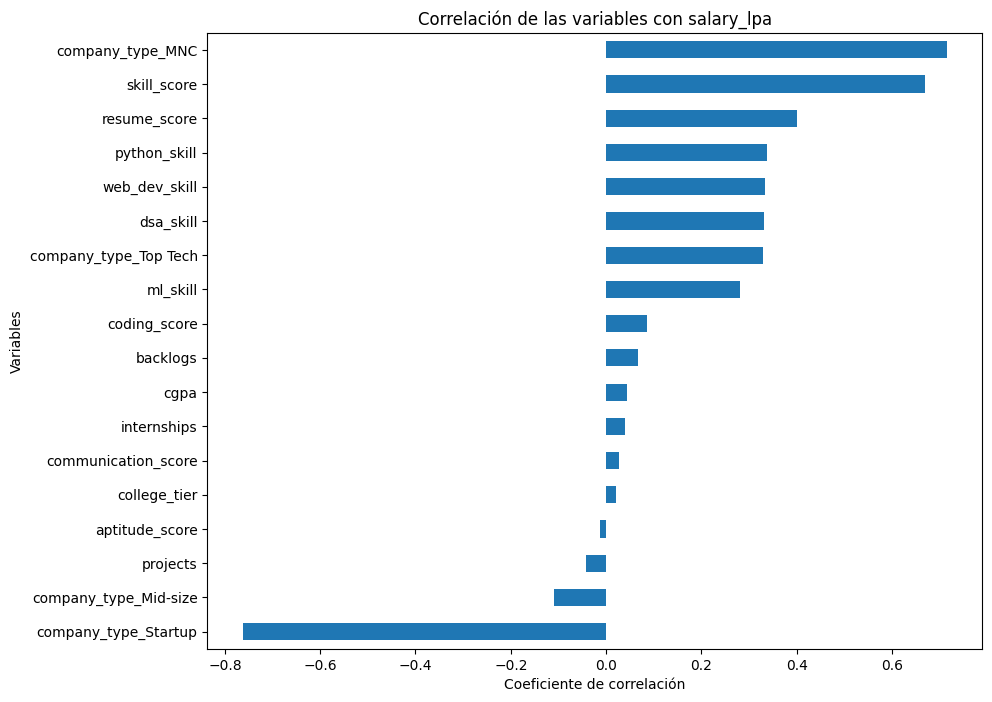

In [13]:
# Crear dataframe para correlación antes del split
df_corr = X_train.copy()
df_corr["salary_lpa"] = y

# Calcular matriz de correlación
matriz_corr = df_corr.corr()

# Obtener solo la correlación de salary_lpa con las demás variables
corr_salary = matriz_corr["salary_lpa"].drop("salary_lpa").sort_values(ascending=False)

# Graficar correlación con salary_lpa
plt.figure(figsize=(10, 8))
corr_salary.sort_values().plot(kind="barh")

plt.title("Correlación de las variables con salary_lpa")
plt.xlabel("Coeficiente de correlación")
plt.ylabel("Variables")
plt.show()


In [15]:
# Ruta para guardar solo los mejores pesos del modelo
current_directory = "/content/drive/MyDrive"
checkpoint_path = current_directory + "/salary_checkpoints/best_salary_model.weights.h5"

best_checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    save_freq="epoch",
    monitor="val_mae",
    save_best_only=True,
    mode="min",
    verbose=1
)

# Crear modelo de red neuronal para regresión
modelo_inicial = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(1)  # una sola salida porque queremos predecir salario
])


modelo_inicial.compile(
    optimizer="adam",
    loss="mse",
    metrics=["mae"]
)

history = modelo_inicial.fit(
    X_train,
    y_train,
    epochs=40,
    batch_size=100,
    validation_data=(X_val, y_val),
    callbacks=[best_checkpoint]
)

# Cargar los mejores pesos guardados
modelo_inicial.load_weights(checkpoint_path)

# Evaluar en test usando el mejor modelo
loss_nn, mae_nn = modelo_inicial.evaluate(X_test, y_test)

print("Red neuronal")
print("Loss:", loss_nn)
print("MAE:", mae_nn)

Epoch 1/40


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


52/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1180.5087 - mae: 29.0654
Epoch 1: val_mae improved from None to 15.40036, saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5

Epoch 1: finished saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 717.2794 - mae: 21.6030 - val_loss: 340.1348 - val_mae: 15.4004
Epoch 2/40
43/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 340.4225 - mae: 15.2396
Epoch 2: val_mae improved from 15.40036 to 14.62151, saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5

Epoch 2: finished saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 331.4657 - mae: 15.0576 - val_loss: 303.8680 - val_mae: 14.6215
Epoch 3/40
42/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 305.2577 - mae: 14.5027
Epoch 3: val_mae improved from 14.62151 to 13.48771, 

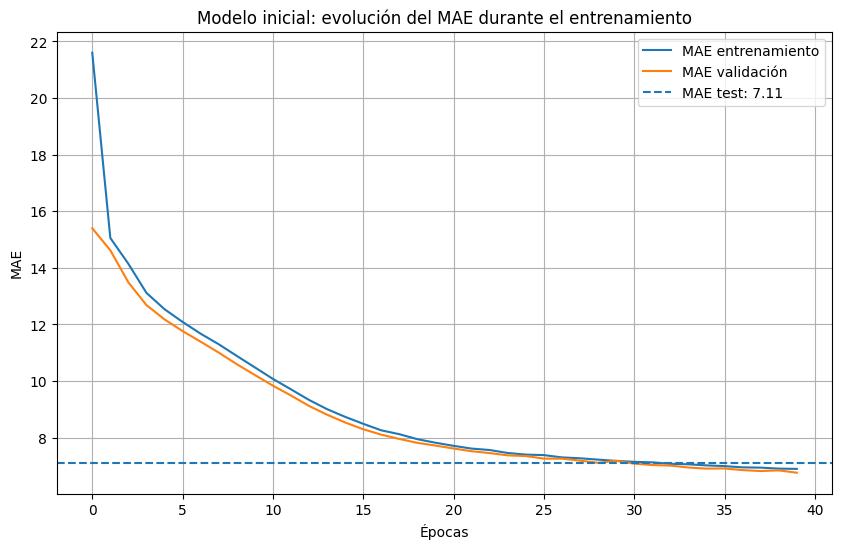

In [19]:
plt.figure(figsize=(10, 6))

plt.plot(history.history["mae"], label="MAE entrenamiento")
plt.plot(history.history["val_mae"], label="MAE validación")


plt.axhline(
    y=mae_nn,
    linestyle="--",
    label=f"MAE test: {mae_nn:.2f}"
)

plt.title("Modelo inicial: evolución del MAE durante el entrenamiento")
plt.xlabel("Épocas")
plt.ylabel("MAE")
plt.legend()
plt.grid(True)
plt.show()

# Modelo mejorado

In [21]:
# Leer archivo
df = pd.read_csv("/content/drive/MyDrive/student_salary.csv")

print(df.columns)

# Eliminar filas con valores vacíos
df = df.dropna()

# Eliminar columnas que no aportan o que no se usarán
df = df.drop("student_id", axis=1)
df = df.drop("placed", axis=1)
df = df.drop("branch", axis=1)
df = df.drop("job_role", axis=1)

# Separar variables independientes y variable objetivo
X = df.drop("salary_lpa", axis=1)
y = df["salary_lpa"]

# Rellenar valores nulos en columnas categóricas
X["company_type"] = X["company_type"].fillna("Unknown")

# Aplicar One Hot Encoding antes de la correlación
X = pd.get_dummies(X, columns=["company_type"], dtype=int)

# División en train, validation y test
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.3, random_state=42
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42
)

# Columnas numéricas que sí existen en el dataset
numerical_features = ["cgpa", "coding_score", "communication_score","aptitude_score","projects", "resume_score","skill_score"]

X_train_final = X_train.copy()
X_val_final = X_val.copy()
X_test_final = X_test.copy()


# Escalamiento
sc = StandardScaler()

X_train_final[numerical_features] = sc.fit_transform(X_train[numerical_features])
X_val_final[numerical_features] = sc.transform(X_val[numerical_features])
X_test_final[numerical_features] = sc.transform(X_test[numerical_features])




Index(['student_id', 'cgpa', 'branch', 'college_tier', 'python_skill',
       'dsa_skill', 'ml_skill', 'web_dev_skill', 'coding_score',
       'communication_score', 'aptitude_score', 'internships', 'projects',
       'backlogs', 'resume_score', 'skill_score', 'placed', 'company_type',
       'job_role', 'salary_lpa'],
      dtype='object')


# 4. Preparación y normalización de datos

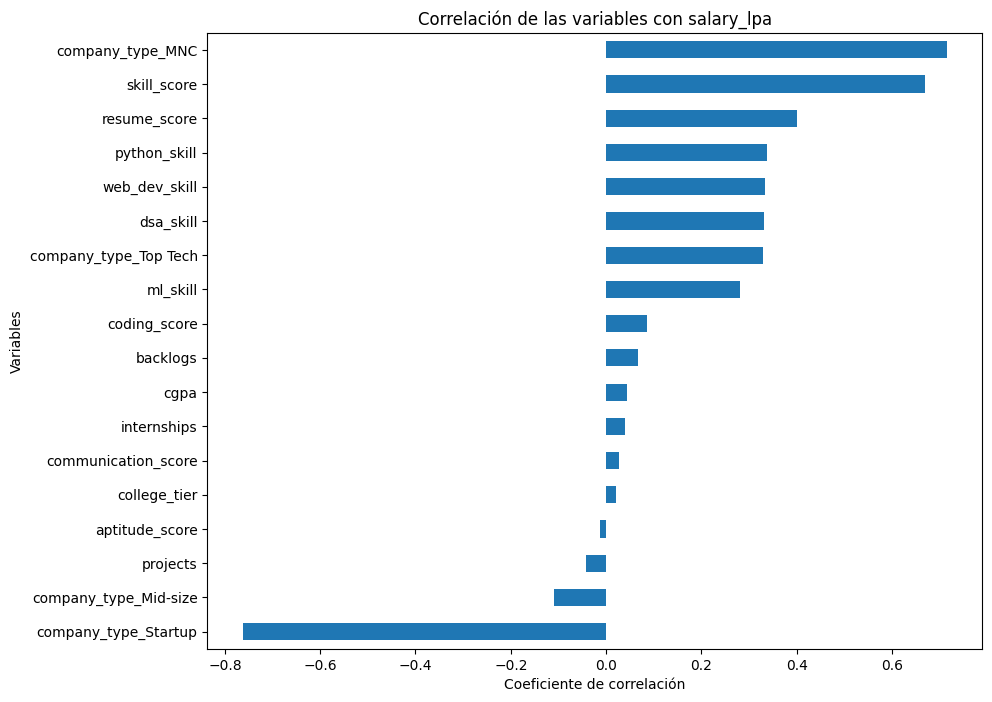

In [22]:
# Crear dataframe para correlación antes del split
df_corr = X_train.copy()
df_corr["salary_lpa"] = y

# Calcular matriz de correlación
matriz_corr = df_corr.corr()

# Obtener solo la correlación de salary_lpa con las demás variables
corr_salary = matriz_corr["salary_lpa"].drop("salary_lpa").sort_values(ascending=False)

# Graficar correlación con salary_lpa
plt.figure(figsize=(10, 8))
corr_salary.sort_values().plot(kind="barh")

plt.title("Correlación de las variables con salary_lpa")
plt.xlabel("Coeficiente de correlación")
plt.ylabel("Variables")
plt.show()


In [23]:
# Convertir los datos escalados a DataFrame
X_train_processed = pd.DataFrame(
    X_train_final,
    columns=X_train.columns,
    index=X_train.index
)

X_test_processed = pd.DataFrame(
    X_test_final,
    columns=X_test.columns,
    index=X_test.index
)

X_val_processed = pd.DataFrame(
    X_val_final,
    columns=X_val.columns,
    index=X_val.index
)
# Agregar nuevamente la variable objetivo salary_lpa
train_processed = X_train_processed.copy()
train_processed["salary_lpa"] = y_train

test_processed = X_test_processed.copy()
test_processed["salary_lpa"] = y_test

# Guardar como CSV
train_processed.to_csv("train_procesado.csv", index=False)
test_processed.to_csv("test_procesado.csv", index=False)

print("Archivos generados correctamente:")
print("train_procesado.csv")
print("test_procesado.csv")


profile = ProfileReport(train_processed, title="Reporte de análisis exploratorio despues de normalización", explorative=True)

profile.to_notebook_iframe()

profile = ProfileReport(test_processed, title="Reporte de análisis exploratorio despues de normalización", explorative=True)

profile.to_notebook_iframe()



Archivos generados correctamente:
train_procesado.csv
test_procesado.csv


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 19/19 [00:00<00:00, 45.19it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 19/19 [00:00<00:00, 28.64it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
modelo = LinearRegression()
modelo.fit(X_train_final, y_train)
print("R2 en entrenamiento:", modelo.score(X_train_final, y_train))
print("R2 en prueba:", modelo.score(X_test_final, y_test))

predicciones = modelo.predict(X_test_final)

mse = mean_squared_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)
mae = mean_absolute_error(y_test, predicciones)

print(f"Error Cuadrático Medio (MSE): {mse}")
print(f"Error Absoluto medio (MAE): {mae}")
print(f"Coeficiente de Determinación (R2): {r2}")


R2 en entrenamiento: 0.8531400102071043
R2 en prueba: 0.8505878902721852
Error Cuadrático Medio (MSE): 41.62087920454001
Error Absoluto medio (MAE): 5.36324292328981
Coeficiente de Determinación (R2): 0.8505878902721852


In [25]:
# Ruta para guardar TODO el modelo
current_directory = "/content/drive/MyDrive"
checkpoint_path = current_directory + "/salary_checkpoints/best_salary_model.keras"

best_checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=False,
    save_freq="epoch",
    monitor="val_mae",
    save_best_only=True,
    mode="min",
    verbose=1
)

# Crear modelo de red neuronal para regresión
modelo2 = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(1)
])

modelo2.compile(
    optimizer="adam",
    loss="mse",
    metrics=["mae"]
)

history = modelo2.fit(
    X_train,
    y_train,
    epochs=100,
    batch_size=40,
    validation_data=(X_val, y_val),
    callbacks=[best_checkpoint]
)

mejor_modelo = load_model(checkpoint_path)

# Evaluar en test usando el mejor modelo
loss_nn, mae_nn = mejor_modelo.evaluate(X_test, y_test)

print("Red neuronal")
print("Loss:", loss_nn)
print("MAE:", mae_nn)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
127/135 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3166.2822 - mae: 47.2030
Epoch 1: val_mae improved from None to 13.02601, saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.keras

Epoch 1: finished saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.keras
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 1309.3962 - mae: 26.6197 - val_loss: 240.9838 - val_mae: 13.0260
Epoch 2/100
132/135 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 245.0424 - mae: 12.9062
Epoch 2: val_mae improved from 13.02601 to 12.02579, saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.keras

Epoch 2: finished saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.keras
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 233.0663 - mae: 12.5349 - val_loss: 207.0203 - val_mae: 12.0258
Epoch 3/100
132/135 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 206.7364 - mae: 11.7310
Epoch 3: val_mae improved from 12.02579 to 10.18

In [26]:
predicciones = modelo2.predict(X_test).flatten()

tabla_resultados = pd.DataFrame({
    "Valor real": y_test.values,
    "Valor predicho": predicciones,
    "Error absoluto": abs(y_test.values - predicciones)
})

tabla_resultados = tabla_resultados.round(2)

tabla_resultados.head(20)

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


,Valor real,Valor predicho,Error absoluto
0,79.07,77.690002,1.38
1,49.36,42.139999,7.22
2,68.70,58.560001,10.14
3,59.41,59.310001,0.10
4,82.32,76.870003,5.45
5,63.24,65.519997,2.28
6,69.85,77.040001,7.19
7,60.82,60.130001,0.69
8,60.27,57.009998,3.26
9,57.59,60.380001,2.79


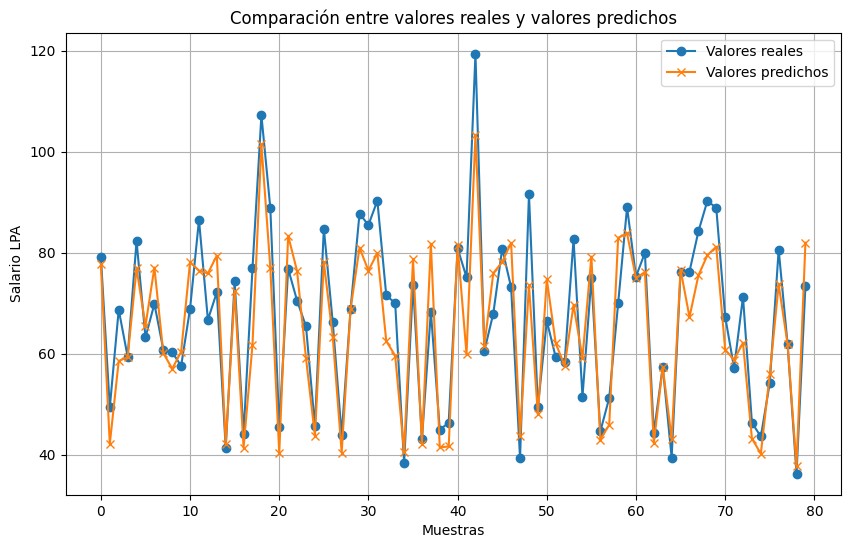

In [27]:
plt.figure(figsize=(10, 6))

plt.plot(y_test.values[:80], marker='o', label="Valores reales")
plt.plot(predicciones[:80], marker='x', label="Valores predichos")

plt.title("Comparación entre valores reales y valores predichos")
plt.xlabel("Muestras")
plt.ylabel("Salario LPA")
plt.legend()
plt.grid(True)
plt.show()

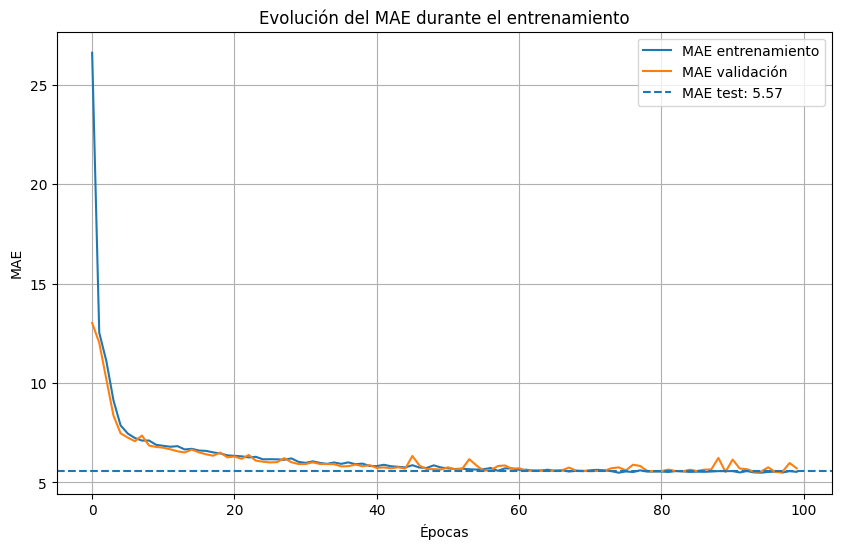

In [28]:
# Evaluar el modelo en test
loss_test, mae_test = modelo2.evaluate(X_test, y_test, verbose=0)

plt.figure(figsize=(10, 6))

plt.plot(history.history["mae"], label="MAE entrenamiento")
plt.plot(history.history["val_mae"], label="MAE validación")

# Línea horizontal del MAE en test
plt.axhline(
    y=mae_test,
    linestyle="--",
    label=f"MAE test: {mae_test:.2f}"
)

plt.title("Evolución del MAE durante el entrenamiento")
plt.xlabel("Épocas")
plt.ylabel("MAE")
plt.legend()
plt.grid(True)
plt.show()

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


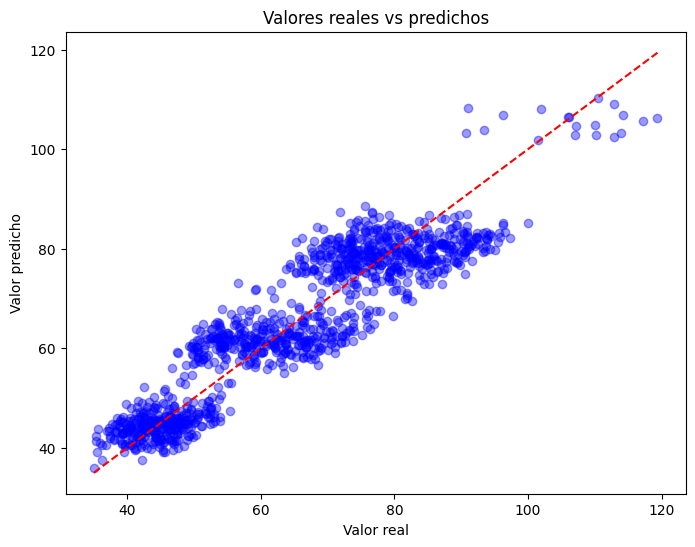

In [29]:
# Cargar los pesos guardados por ModelCheckpoint
modelo2.load_weights(checkpoint_path)

# Predicciones con el mejor checkpoint
predicciones = modelo2.predict(X_test).flatten()

plt.figure(figsize=(8, 6))

# Puntos: valor real vs valor predicho
plt.scatter(
    y_test,
    predicciones,
    color="blue",
    alpha=0.4
)

# Línea diagonal
plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--"
)

plt.title("Valores reales vs predichos")
plt.xlabel("Valor real")
plt.ylabel("Valor predicho")
plt.show()

# Random Forest Regressor

In [34]:
modelo_rf = RandomForestRegressor(
    n_estimators=500,
    max_depth=10,
    max_features=5,
    min_samples_split=3,
    min_samples_leaf=1,
    n_jobs=-1,
    bootstrap=True,
    random_state=35
)

modelo_rf.fit(X_train, y_train)

y_pred_rf = modelo_rf.predict(X_test)

mae_rf = mean_absolute_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)

print("Random Forest con nuevas variables")
print("MAE:", mae_rf)
print("RMSE:", rmse_rf)
print("R2:", r2_rf)

# Guardar el modelo y columnas
ruta_rf = "/content/drive/MyDrive/salary_checkpoints/random_forest_salary_model.pkl"
joblib.dump(modelo_rf, ruta_rf)

ruta_columnas = "/content/drive/MyDrive/salary_checkpoints/columnas_modelo.pkl"
joblib.dump(X_train.columns.tolist(), ruta_columnas)


Random Forest con nuevas variables
MAE: 5.346817549557733
RMSE: 6.466298333794878
R2: 0.8498981574541152


['/content/drive/MyDrive/salary_checkpoints/columnas_modelo.pkl']

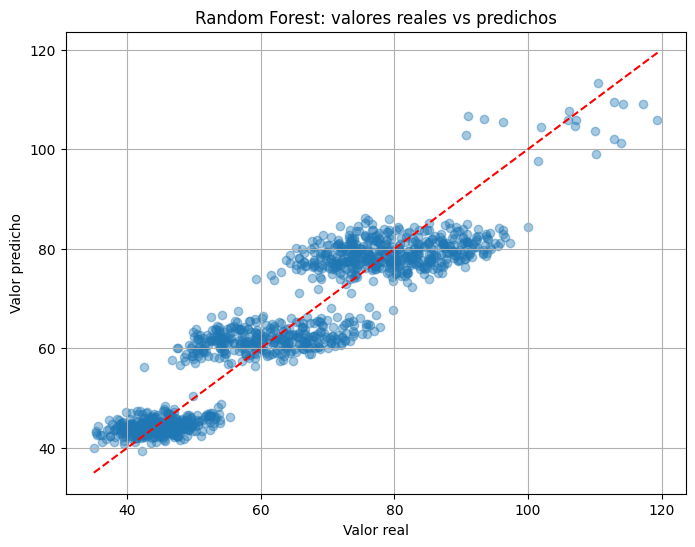

In [35]:
# Predicciones con Random Forest
predicciones = modelo_rf.predict(X_test)

plt.figure(figsize=(8, 6))

# Puntos: valor real vs valor predicho
plt.scatter(
    y_test,
    predicciones,
    alpha=0.4
)

# Línea diagonal: predicción perfecta
plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--"
)

plt.title("Random Forest: valores reales vs predichos")
plt.xlabel("Valor real")
plt.ylabel("Valor predicho")
plt.grid(True)
plt.show()